# Data Extraction from the images

## Installing necessary libraries and data

In [6]:
#unzip the data
# !tar -xvf data.zip

In [10]:
# !pip install pandas
# !pip install pytesseract

## Data Labelling

- Assumption: We assume that the data in all the updated images are present in the left-bottom corner for simplicity. For more complex data extraction proper dataset is required to train a model.
- The images are being cropped based on the data placement for extracting the text using pytesseract.

Resolution: 3264x2448
Number of color channels: 3


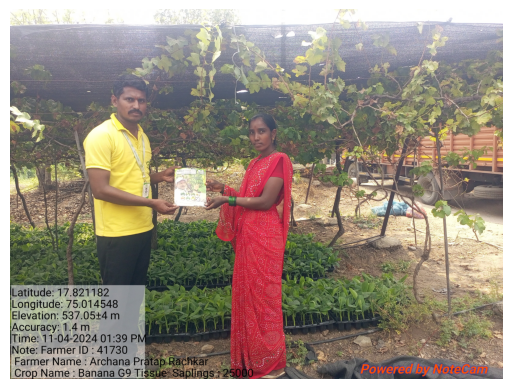

Resolution: 1920x1080
Number of color channels: 3


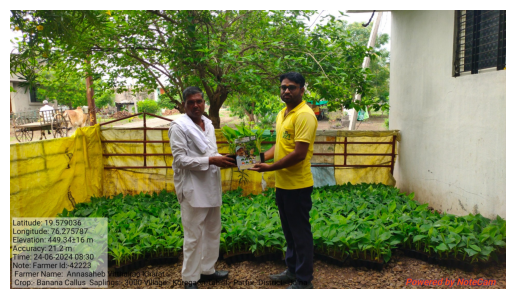

Resolution: 3840x2160
Number of color channels: 3


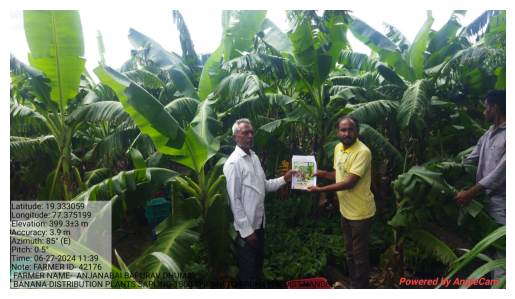

Resolution: 1920x1080
Number of color channels: 3


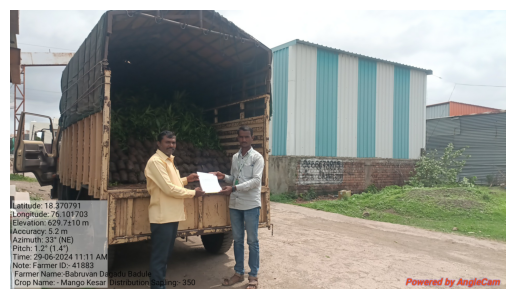

Resolution: 3840x2160
Number of color channels: 3


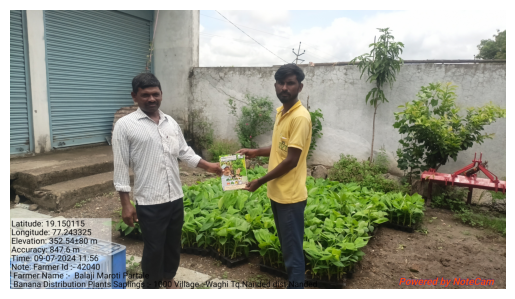

Resolution: 3840x2160
Number of color channels: 3


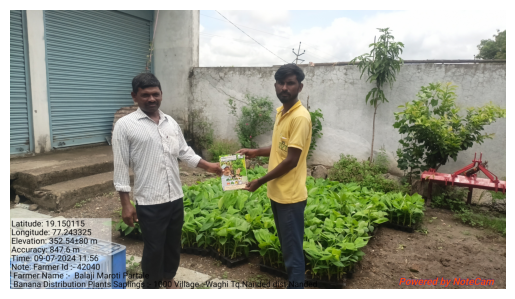

Resolution: 3840x2160
Number of color channels: 3


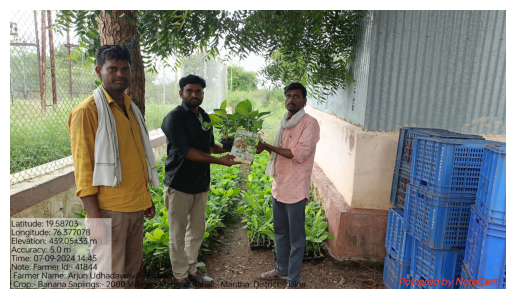

Resolution: 1280x720
Number of color channels: 3


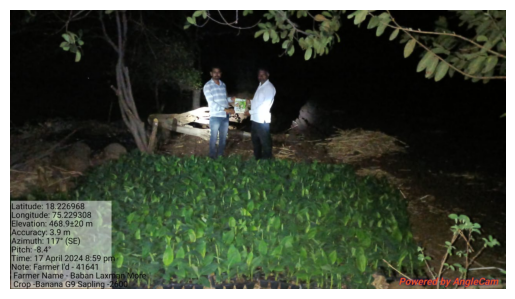

In [31]:
import cv2
import matplotlib.pyplot as plt

def display_images(images, path):
    for image in images:
    # Read an image from file
        image = cv2.imread(f'{path}/' + image)
        
        # Convert the image from BGR to RGB (OpenCV uses BGR by default)
        image_rgb = cv2.cvtColor(image, cv2.COLOR_BGR2RGB)
        height, width, channels = image.shape
        
        # Display the image using matplotlib
        plt.imshow(image_rgb)
        
        # Display the resolution
        print(f"Resolution: {width}x{height}")
        print(f"Number of color channels: {channels}")
        
        plt.axis('off')  # Hide axes
        plt.show()
    
images = ['20240411_134000.jpg', '20240624_083054.jpg', '20240627_113950.jpg', '20240629_111138.jpg', '20240709_115613.jpg', '20240709_115613.jpg', 
          '20240709_144534.jpg', 'IMG-20240417-WA0033.jpg']

display_images(images, 'data')

In [7]:
#Making the resolution uniform.

# Input directory where images are located
input_directory = 'data'  # Replace with the input directory path

# Output directory where resized images will be saved
output_directory = 'data_new'  # Replace with the output directory path

# Create the output directory if it doesn't exist
if not os.path.exists(output_directory):
    os.makedirs(output_directory)

# Desired resolution
new_resolution = (1280, 720)

# Loop through the image filenames in the list
for image_name in images:
    # Construct the full input path
    input_image_path = os.path.join(input_directory, image_name)
    
    # Read the image
    image = cv2.imread(input_image_path)
    
    # Check if the image was loaded successfully
    if image is None:
        print(f"Error: Unable to load image {image_name}")
        continue
    
    # Resize the image to the new resolution
    resized_image = cv2.resize(image, new_resolution)
    
    # Construct the full output path
    output_image_path = os.path.join(output_directory, image_name)
    
    # Save the resized image
    cv2.imwrite(output_image_path, resized_image)
    
    print(f"Resized image saved as: {output_image_path}")

print("All images have been resized and saved.")


Resized image saved as: data_new\20240411_134000.jpg
Resized image saved as: data_new\20240624_083054.jpg
Resized image saved as: data_new\20240627_113950.jpg
Resized image saved as: data_new\20240629_111138.jpg
Resized image saved as: data_new\20240709_115613.jpg
Resized image saved as: data_new\20240709_115613.jpg
Resized image saved as: data_new\20240709_144534.jpg
Resized image saved as: data_new\IMG-20240417-WA0033.jpg
All images have been resized and saved.


Resolution: 1280x720
Number of color channels: 3


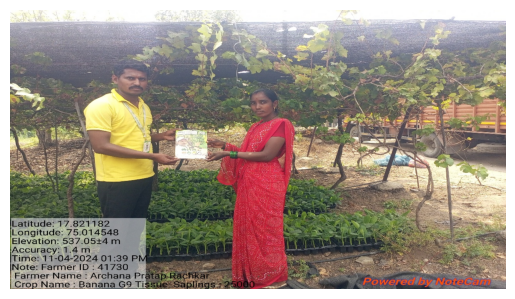

Resolution: 1280x720
Number of color channels: 3


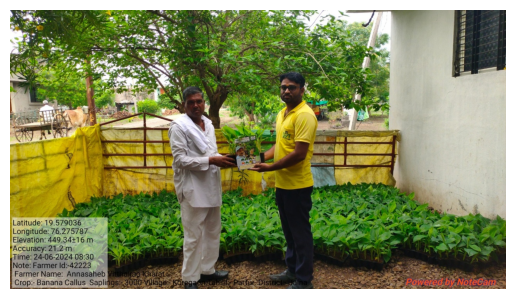

Resolution: 1280x720
Number of color channels: 3


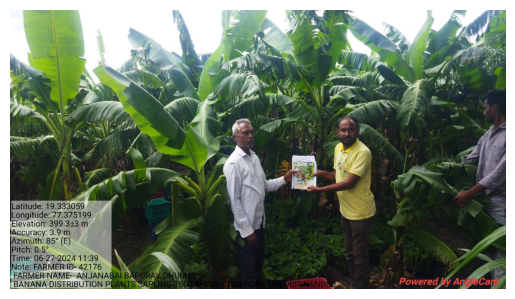

Resolution: 1280x720
Number of color channels: 3


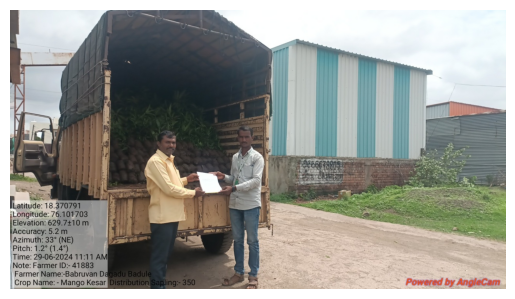

Resolution: 1280x720
Number of color channels: 3


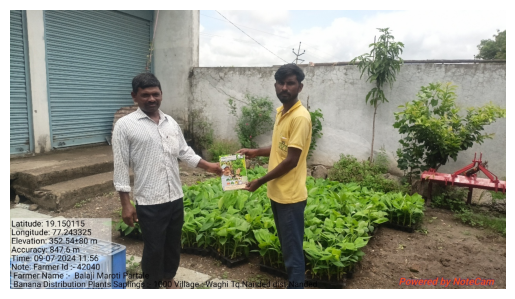

Resolution: 1280x720
Number of color channels: 3


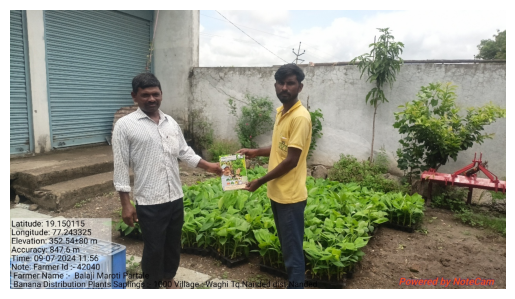

Resolution: 1280x720
Number of color channels: 3


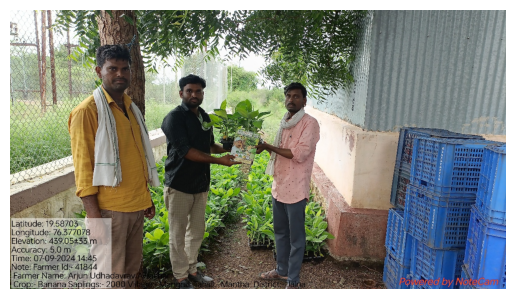

Resolution: 1280x720
Number of color channels: 3


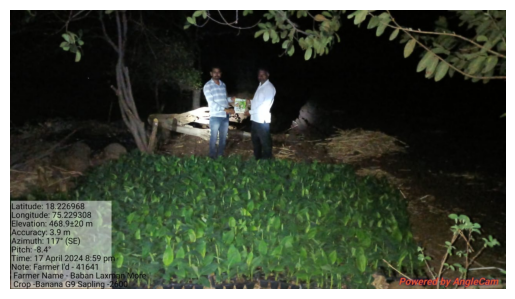

In [8]:
for image in images:
    # Read an image from file
    image = cv2.imread('data_new/' + image)
    
    # Convert the image from BGR to RGB (OpenCV uses BGR by default)
    image_rgb = cv2.cvtColor(image, cv2.COLOR_BGR2RGB)
    height, width, channels = image.shape
    
    # Display the image using matplotlib
    plt.imshow(image_rgb)
    
    # Display the resolution
    print(f"Resolution: {width}x{height}")
    print(f"Number of color channels: {channels}")
    
    plt.axis('off')  # Hide axes
    plt.show()


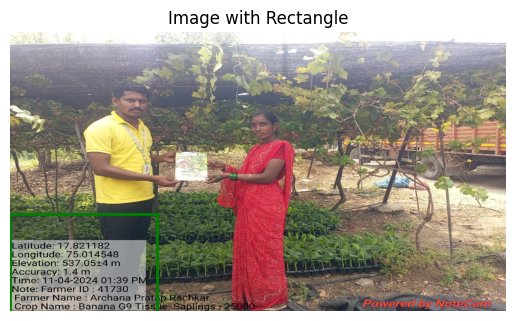

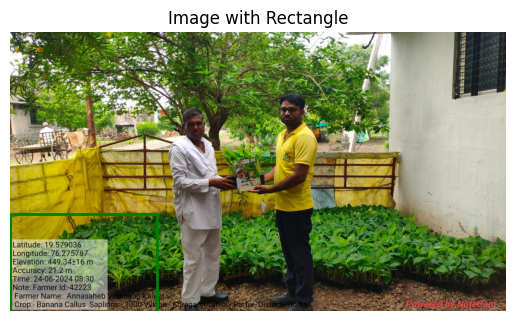

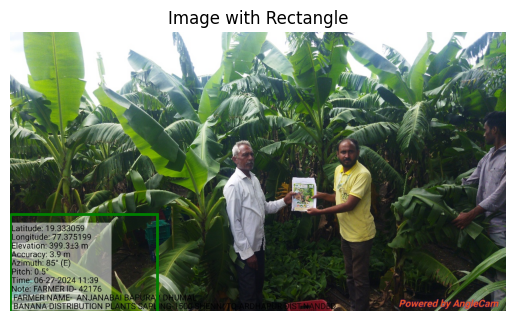

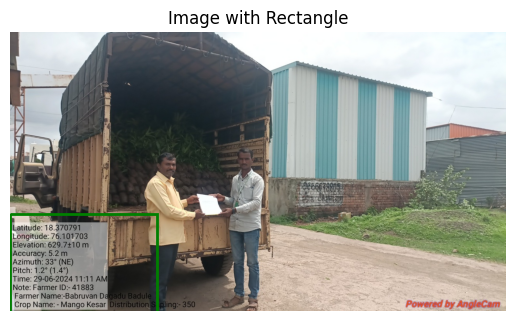

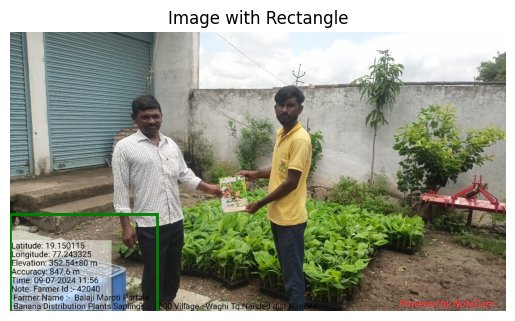

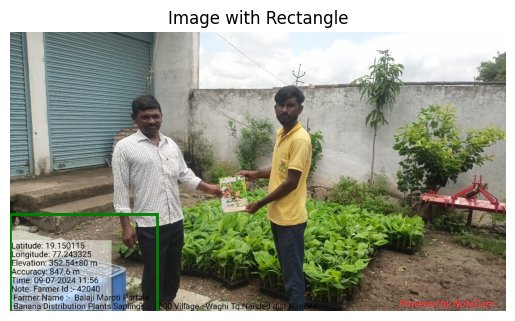

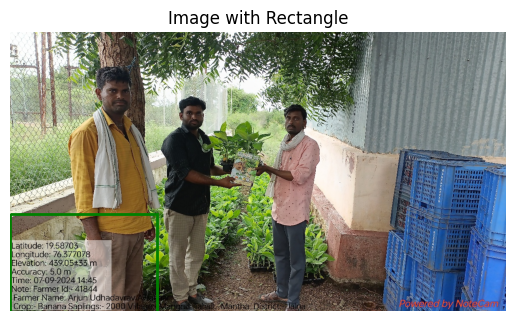

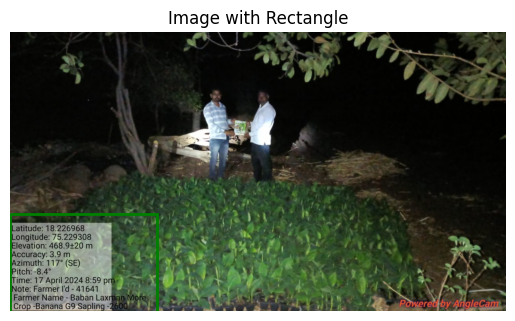

In [52]:
# Finding the data location.

import matplotlib.patches as patches

for image in images:
    
    # Load the image using OpenCV
    image = cv2.imread(f'data_new/{image}')  # Replace with your image path
    
    # Convert the image from BGR (OpenCV default) to RGB (Matplotlib default)
    image_rgb = cv2.cvtColor(image, cv2.COLOR_BGR2RGB)
    
    # Define the top-left corner (x, y) and the dimensions of the rectangle (width, height)
    x = 0    # X-coordinate of the top-left corner
    y = 470     # Y-coordinate of the top-left corner
    width = 380
    height = 290
    
    # Create a figure and axis to display the image
    fig, ax = plt.subplots()
    
    # Display the image on the axis
    ax.imshow(image_rgb)
    
    # Create a rectangle patch
    rectangle = patches.Rectangle((x, y), width, height, linewidth=2, edgecolor='green', facecolor='none')
    
    # Add the rectangle to the axis
    ax.add_patch(rectangle)
    
    # Set the title
    ax.set_title("Image with Rectangle")
    
    # Turn off the axis (optional)
    ax.axis('off')
    
    # Show the image with the rectangle
    plt.show()

- x, y = (0, 470) and height, width = (290, 380).
- Each image is re-sized into 1280 x 720 pixels before labelling.

In [89]:
#Cropping the labels and storing them in a seperate folder.
def crop_and_save_images(input_folder, output_folder, crop_spec):
    """
    Crop all images in the input folder based on x, y, width, and height
    and save them in a separate folder.

    Parameters:
        input_folder (str): Path to the folder containing input images.
        output_folder (str): Path to the folder to save cropped images.
        crop_spec (tuple): A tuple (x, y, width, height) specifying the crop region.
    """
    # Ensure the output folder exists
    os.makedirs(output_folder, exist_ok=True)

    # Unpack crop specifications
    x, y, width, height = crop_spec

    for img_name in os.listdir(input_folder):
        input_path = os.path.join(input_folder, img_name)
        output_path = os.path.join(output_folder, img_name)

        # Load the image
        image = cv2.imread(input_path)
        if image is None:
            print(f"Error: Unable to read {input_path}. Skipping...")
            continue

        # Perform cropping
        cropped_image = image[y:y+height, x:x+width]
        
        #Converting into grayscale
        gray_img = cv2.cvtColor(cropped_image, cv2.COLOR_RGB2GRAY)

        #Interpolation
        resized_img = cv2.resize(gray_img, None, fx=2, fy=2, interpolation=cv2.INTER_CUBIC)
        
        # Save the cropped image
        cv2.imwrite(output_path, resized_img)
        print(f"Saved cropped image: {output_path}")


input_folder = 'data_new'
output_folder = 'cropped_images'
crop_specs = (0, 470, 380, 290)

crop_and_save_images(input_folder, output_folder, crop_specs)

Saved cropped image: cropped_images\20240411_134000.jpg
Saved cropped image: cropped_images\20240624_083054.jpg
Saved cropped image: cropped_images\20240627_113950.jpg
Saved cropped image: cropped_images\20240629_111138.jpg
Saved cropped image: cropped_images\20240709_115613.jpg
Saved cropped image: cropped_images\20240709_144534.jpg
Saved cropped image: cropped_images\IMG-20240417-WA0033.jpg


Displaying the cropped images: 
Resolution: 760x500
Number of color channels: 3


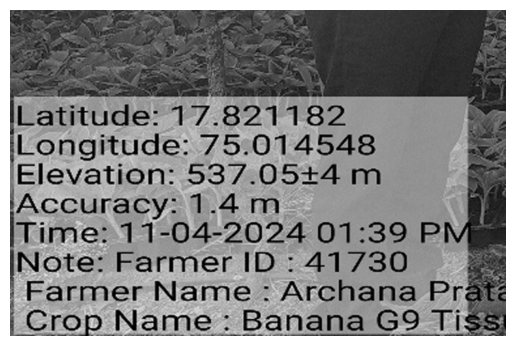

Resolution: 760x500
Number of color channels: 3


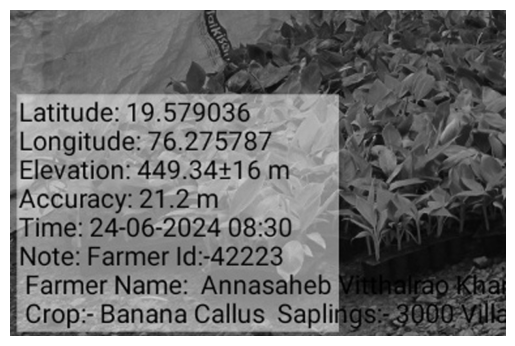

Resolution: 760x500
Number of color channels: 3


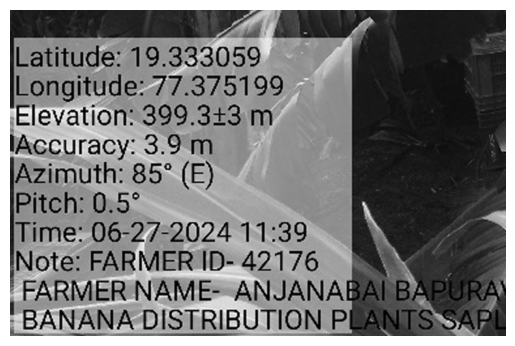

Resolution: 760x500
Number of color channels: 3


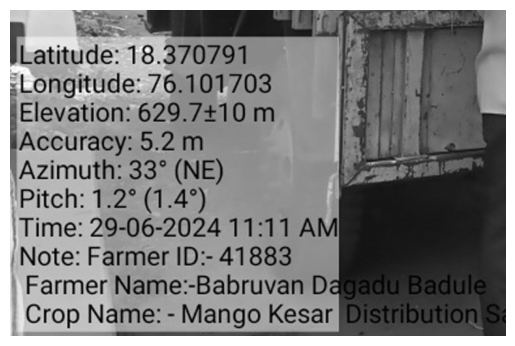

Resolution: 760x500
Number of color channels: 3


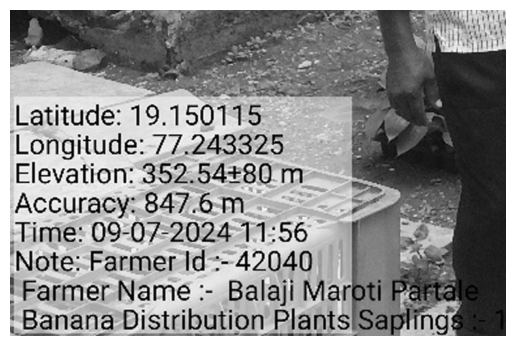

Resolution: 760x500
Number of color channels: 3


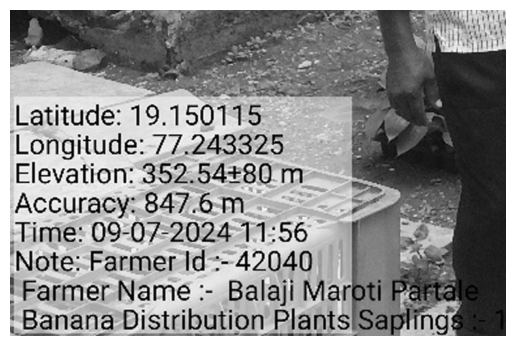

Resolution: 760x500
Number of color channels: 3


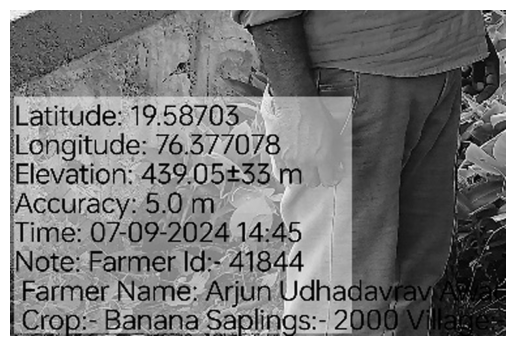

Resolution: 760x500
Number of color channels: 3


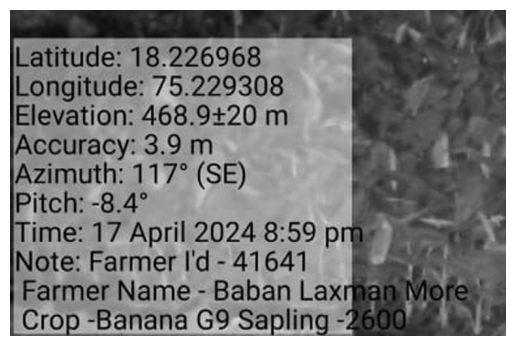

In [90]:
print('Displaying the cropped images: ')
display_images(images, output_folder)
#The clarity of the image seems to be fine.

## Text Extraction using PyTesseract

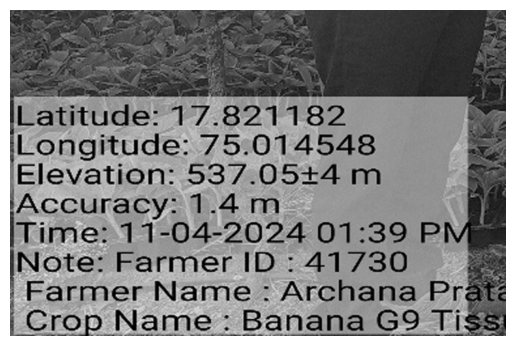

Latitude: 17.821182
‘Longitude: 75:014548
Elevation: 537.05+4 m
Accuracy: 1.4 m
Time: 11-04-2024 01:39 P
Note: Farmer ID : 41730
Farmer Name: Archana Pr
‘Crop Name: Banana G9 T


------------------------------


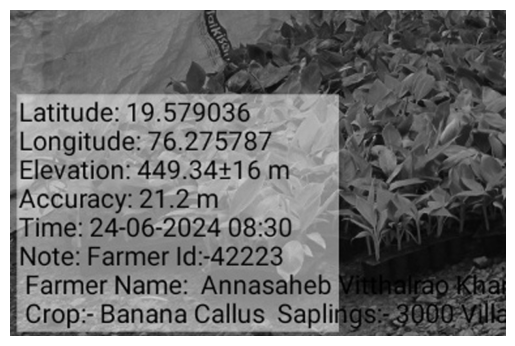

Latitude: 19, 579036
‘Longitude: 76.275787
‘Elevation: 449.34+16 m
"Accuracy: 21.2:m

«lime: 24-06-2024 08:30
Note: Farmer Id:-42223
Farmer Name: Annasaheb
Crop:- Banana Callus Sapling


------------------------------


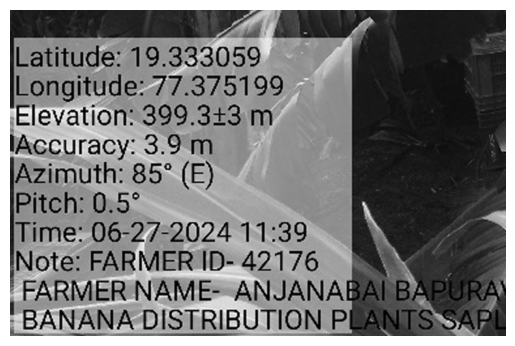

Latitude: 19.333059
Longitude: 77.375199
Elevation: 399.343 m
‘Accuracy: 3.9m
Azimuth: 85° (E)
Pitch: 0.5°

Time: 06-27-2024 11:39
Note: FARMERID- 42176
FARMER NAME--ANJANAE
- BANANA DISTRIBUTION PH

------------------------------


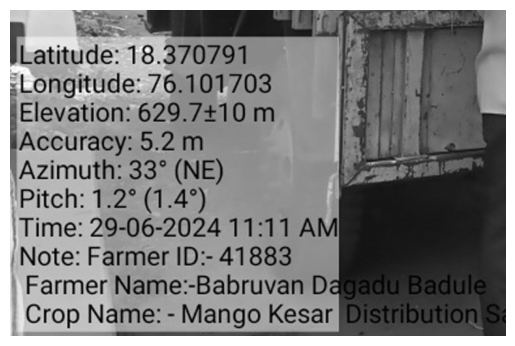

Rosine 18.370791
-Longitude: 76.101703
Elevation: 629.7410 m
Accuracy: 5.2 m
\Azimuth: 33° (NE)
Pitch: 1.2° (1.4°)
Time: 29-06-2024 11:11 AM
Note: Farmer ID:- 41883
Farmer Name:-Babruvan Da
Crop Name: - Mango Kesar

------------------------------


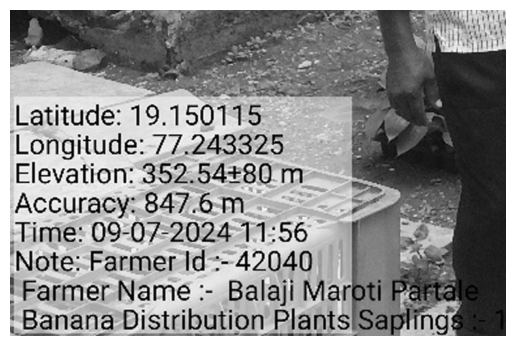

Latitude: 19.150115
Longitude: 77.243325
Elevation: 352.54+80 m
Accuracy: 847.6-m
Time: 09-07-2024 11:56
Note: Farmer Id :--42040
‘Farmer Name :- Balaji M
Banana Distribution Plants!

------------------------------


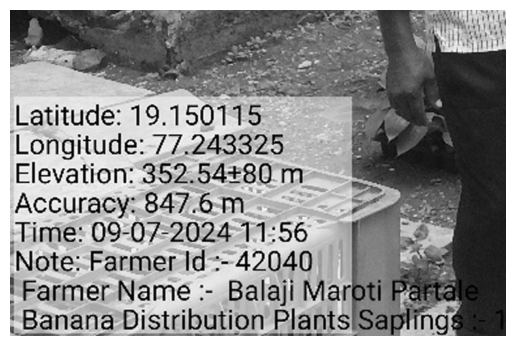

Latitude: 19.150115
Longitude: 77.243325
Elevation: 352.54+80 m
Accuracy: 847.6-m
Time: 09-07-2024 11:56
Note: Farmer Id :--42040
‘Farmer Name :- Balaji M
Banana Distribution Plants!

------------------------------


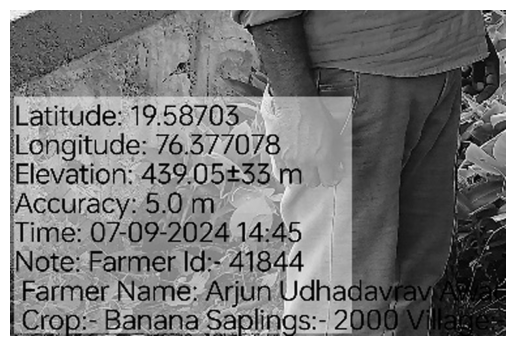

atitude: 19.58703

Longitude: 76.377078

Elevation: 439.05+33.m

Accuracy: 5.0 m

Time: 07-09-2024 14:45
Note: Farmer Id:= 41844 da
Farmer Name;Arjun Udha

i Crop:- Banana Saplings:


------------------------------


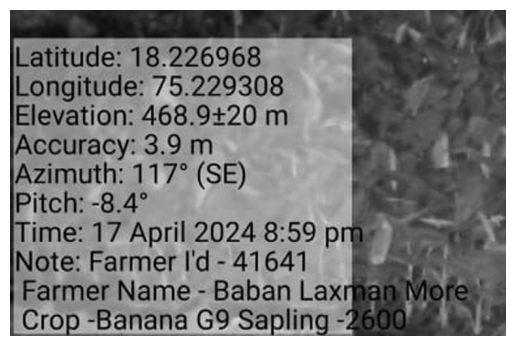

Latitude: 18.226968
Longitude: 75.229308
Elevation: 468.9420 m
Accuracy: 3.9 m

Azimuth: 117° (SE)
Pitch: -8.4°

ime: 17 April 2024 8:59 pr
Note: Farmer I'd - 41641


------------------------------


In [91]:
import pytesseract as pt
from PIL import Image

extracted_text = []
path = 'cropped_images'
for image in images:
    image = cv2.imread(f'{path}/' + image)

    plt.imshow(image)
    plt.axis('off')  # Hide axes
    plt.show()
    
    print(pt.image_to_string(image))

    #Storing the extracted text
    extracted_text.append(pt.image_to_string(image))
    print('-'*30)


In [84]:
print(extracted_text)

['Latitude: 17.821182\n‘Longitude: 75:014548\nElevation: 537.05+4 m\nAccuracy: 1.4 m\nTime: 11-04-2024 01:39 P\nNote: Farmer ID : 41730\nFarmer Name: Archana Pr\n‘Crop Name: Banana G9 T\n\n', 'Latitude: 19, 579036\n‘Longitude: 76.275787\n‘Elevation: 449.34+16 m\n"Accuracy: 21.2:m\n\n«lime: 24-06-2024 08:30\nNote: Farmer Id:-42223\nFarmer Name: Annasaheb\nCrop:- Banana Callus Sapling\n\n', 'Latitude: 19.333059\nLongitude: 77.375199\nElevation: 399.343 m\n‘Accuracy: 3.9m\nAzimuth: 85° (E)\nPitch: 0.5°\n\nTime: 06-27-2024 11:39\nNote: FARMERID- 42176\nFARMER NAME--ANJANAE\n- BANANA DISTRIBUTION PH\n', 'Rosine 18.370791\n-Longitude: 76.101703\nElevation: 629.7410 m\nAccuracy: 5.2 m\n\\Azimuth: 33° (NE)\nPitch: 1.2° (1.4°)\nTime: 29-06-2024 11:11 AM\nNote: Farmer ID:- 41883\nFarmer Name:-Babruvan Da\nCrop Name: - Mango Kesar\n', 'Latitude: 19.150115\nLongitude: 77.243325\nElevation: 352.54+80 m\nAccuracy: 847.6-m\nTime: 09-07-2024 11:56\nNote: Farmer Id :--42040\n‘Farmer Name :- Balaji M\nB

In [120]:
import re

def extract_features(data):
    # Split the input data into lines
    lines = data.strip().split("\n")
    
    # Remove empty lines
    lines = [line for line in lines if line.strip() != '']
    
    # Replace ':' with '.' for decimal-like values
    lines = [line.replace(":", ".") if re.search(r"\d+:\d+", line) else line for line in lines]
    
    # Updated regex for latitude, longitude, elevation, accuracy
    decimal_regex = r"[-+]?[0-9]*\.?[0-9]+(?:\.[0-9]+)?"
    
    # Extract latitude, longitude, elevation, accuracy from the first 4 lines
    latitude = re.search(decimal_regex, lines[0]).group()
    longitude = re.search(decimal_regex, lines[1]).group()
    elevation = re.search(decimal_regex, lines[2]).group()
    accuracy = re.search(decimal_regex, lines[3]).group()

    # Search for farmer name and farmer ID in all lines
    farmer_id = None
    farmer_name = None
    for line in lines:
        # Check for farmer ID
        if re.search(r"[fF]armer\s*[iI][dD][:;=]*", line, re.IGNORECASE):
            farmer_id = re.search(r"\d+", line).group()
        # Check for farmer name
        if re.search(r"[fF]armer\s*name[:;=]*", line, re.IGNORECASE):
            farmer_name = re.search(r"[fF]armer\s*name[:;=-]*\s*(.*)", line, re.IGNORECASE).group(1).strip()
    
    # Return the extracted features as a dictionary
    return {
        "latitude": latitude,
        "longitude": longitude,
        "elevation": elevation,
        "accuracy": accuracy,
        "farmer_id": farmer_id,
        "farmer_name": farmer_name
    }


In [121]:
cleaned_data = []
for data in extracted_text:
    cleaned_data.append(extract_features(data))

for data in cleaned_data:
    print(data)
    print('*'*30)

{'latitude': '17.821182', 'longitude': '75.014548', 'elevation': '537.05', 'accuracy': '1.4', 'farmer_id': '41730', 'farmer_name': 'Archana Pr'}
******************************
{'latitude': '19', 'longitude': '76.275787', 'elevation': '449.34', 'accuracy': '21.2', 'farmer_id': '42223', 'farmer_name': 'Annasaheb'}
******************************
{'latitude': '19.333059', 'longitude': '77.375199', 'elevation': '399.343', 'accuracy': '3.9', 'farmer_id': '42176', 'farmer_name': 'ANJANAE'}
******************************
{'latitude': '18.370791', 'longitude': '76.101703', 'elevation': '629.7410', 'accuracy': '5.2', 'farmer_id': '41883', 'farmer_name': 'Babruvan Da'}
******************************
{'latitude': '19.150115', 'longitude': '77.243325', 'elevation': '352.54', 'accuracy': '847.6', 'farmer_id': '42040', 'farmer_name': ':- Balaji M'}
******************************
{'latitude': '19.150115', 'longitude': '77.243325', 'elevation': '352.54', 'accuracy': '847.6', 'farmer_id': '42040', 'farm

## Remarks

- The bg of the text needed to transparent for text extraction and have made an assumption with how the data is structured and placed.
- The script will be able to extract Longitude, Latitude, Elevation, Accuracy, Farmer ID, Farmer Name
- Crop Name is a bit of an issue as it is overstepping the boundary of text. It is not successfully being extracted.